In [45]:
import wandb
import torch
from pathlib import Path
import json
import numpy as np
import sys
import os
import numpy as np
from ipywidgets import widgets,interact,IntProgress
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
from skimage import morphology
from skimage.morphology import closing, square, reconstruction
from skimage import filters
from mpl_toolkits.mplot3d import Axes3D
import os
import glob
import re
import pickle
from PIL import Image
import pandas as pd
#import cv2
from tifffile import imsave, imread
#from numba import jit
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
#import rawpy
import imageio
from struct import unpack
import textwrap
import plotly.express as px

In [46]:
wandb.login()

True

In [47]:
# Load your CSV file
df = pd.read_csv("/scratch/mfaykus/seg_val/resnet_train.csv")

# Display the first few rows to check the structure
print(df.head())

selected_features = [col for col in df.columns if col not in ["LR", "size"]]  # Exclude non-feature columns

print("Selected features:", selected_features)  # Debugging check


   Unnamed: 0 Model Compressor  error_bound  epochs      miou      class  \
0           0  unet        sz3          1.0      10  0.248392  unlabeled   
1           1  unet        sz3          1.0      10  0.248392       road   
2           2  unet        sz3          1.0      10  0.248392   sidewalk   
3           3  unet        sz3          1.0      10  0.248392   building   
4           4  unet        sz3          1.0      10  0.248392       wall   

        iou  run  model_num      LR  size  
0  0.340015    0         18  0.0001     0  
1  0.819422    0         18  0.0001     0  
2  0.386003    0         18  0.0001     0  
3  0.658852    0         18  0.0001     0  
4  0.093988    0         18  0.0001     0  
Selected features: ['Unnamed: 0', 'Model', 'Compressor', 'error_bound', 'epochs', 'miou', 'class', 'iou', 'run', 'model_num']


In [48]:
sweep_config = {
    "method": "grid",  # Options: "random", "bayes", "grid"
    "metric": {
        "name": "miou", 
        "goal": "maximize"
    },
    "parameters": {}
}


In [ ]:
#sweep_configuration = {
#    'method': 'grid',  # You can choose 'random' or 'bayesian' based on your needs
#    'metric': {
#        'name': 'validation_loss',  # Change to 'accuracy' if that's your optimization metric
#        'goal': 'minimize'  # Use 'maximize' if you're tracking accuracy
#    },
#    'parameters': {}
#}


In [50]:
for column in df.columns:
    if column not in ['iou', 'miou']:  # Exclude the metrics
        sweep_config['parameters'][column] = {
            'values': df[column].tolist()
        }

In [52]:
sweep_id = wandb.sweep(sweep_config, project="your_project_name")

wandb: Network error (ReadTimeout), entering retry loop.


KeyboardInterrupt: 

In [43]:
def validate(config=None):
    with wandb.init(config=config):
        config = wandb.config

        # Log hyperparameters (if needed)
        wandb.log({
            "LR": config.LR,
            "size": config.size,
        })

        # Iterate over each row of the DataFrame, logging multiple mIoU values (one per row)
        for idx, row in df.iterrows():
            miou_value = row["miou"]  # Get mIoU value for this row
            feature_values = {feature: row[feature] for feature in selected_features}  # Get selected feature values

            # Log mIoU for each row (validation instance)
            wandb.log({
                "miou": miou_value,
                **feature_values,  # Add feature values to the log
            })

        # Create a table for logging features and mIoU
        table = wandb.Table(dataframe=df)

        # Create scatter plot for each feature vs mIoU
        for feature in selected_features:
            scatter = wandb.plot.scatter(
                table, x=feature, y="miou", title=f"{feature} vs mIoU (Validation)"
            )
            wandb.log({f"scatter_{feature}_vs_mIoU": scatter})

In [44]:
sweep_id = wandb.sweep(sweep_config, project="validation_analysis")  # Create a sweep
wandb.agent(sweep_id, function=validate, count=5)  # Run one iteration per feature


Create sweep with ID: h3l1qy9n
Sweep URL: https://wandb.ai/mfaykus-clemson-university/validation_analysis/sweeps/h3l1qy9n


wandb: Agent Starting Run: zr97smyp with config:
wandb: 	LR: 0.0001
wandb: 	size: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


LR,▁
Unnamed: 0,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▇▇▇▇▇▇▇██
epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
error_bound,▁█▁█▁▁█▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁█▁▁▁▁
iou,▆▁▂█▂▄▃▅▇▃▆▃▇▁▂▆▁▂▇▂▆▅▂▂▇█▂▄▇▇▄▅▆▆▁▂▃▄▅▂
miou,▂███▇▃▃▂█▇▃▃█▂█▇▂█▇▇████▂▆▇▁▇▃▇▆▇██▅▃█▇▁
model_num,█▄▁▁█▁█▁█▁█▁▄▁▄▁▁▁█▄▁██▁▁▁▄▁██▁▄▁█▄▁█▄█▁
run,▁▁▁▂▁▂▁▅▄▅▁▂▁▁▄▁▇▅▁▁▄▇▁▂▂█▁▄▁▄█▅▁▇▄▄▄▁▂▁
size,▁
Compressor,sz3
LR,0.0001


wandb: Agent Starting Run: fn37ubqv with config:
wandb: 	LR: 0.0001
wandb: 	size: 1
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


LR,▁
Unnamed: 0,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇█████
epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
error_bound,▁▁▁▁▁▁█▁▂▁█▁▁▂▁▁▁▁▁█▁█▁▁▁▁██▁█▁▁▁▁▁▁▁▁▂▁
iou,▇▂▆▃▃▁▂▁▂▁▃▇▂▂▇▃▁█▂█▇▃▂▁▇▂▄▁▃▄▇▁▁▂▁▄▂█▂▄
miou,▂▃▃▇▇▇▂▇▇▇▇▁▂▂▃▇▇▇▇▇▃█▆▇▇▂▇▇▆▅▂█▅▂▇▇▃▂▇▅
model_num,█▁▁██▄██▄▁▄▁▁▁▁▁██▁▁▄▄▁▁█▄▄▄██▄▁█▄▁▄████
run,▂▁▁█▁▅▇█▄▅▁▁▁▁▄▅▄▇▁▁▇▂▁▁▂▁▄▁▁▁▁▁▁▁▂▅▁▁▄▄
size,▁
Compressor,sz3
LR,0.0001


wandb: Agent Starting Run: jq24t9k3 with config:
wandb: 	LR: 0.0001
wandb: 	size: 2
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


LR,▁
Unnamed: 0,▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█
epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
error_bound,▁▂▂▂█▁▁▂▁▂▁▁▂▁▁▂▁▁▁▁▂▁█▁▁▂▁▁▁▂█▂▁▁█▁▁█▁▂
iou,▆▅▁▅▂▄▆▄▇▃▄▂▄▅▆▃▄▇▄▅▁▄▆▅▄▃▂▄▂▁▁▁▃▃▁▆█▃▆▅
miou,▇▇█▇▇▃▃▁▇▇▃▃▂▇▅▃▃▂▇▅▇▇▄▇▄▂▇▇▇▇▃▂▆▃▃▃▇▃▇▇
model_num,▁▁█▄▁▁▁█▄▄██▁███▁▁███▁▁▁▄▁█▁▄▁▄▄▁▁▁▄▄▄█▄
run,▁▆▁▁▁▁▃▁▁▅▃▁▆▁▁▃▃▁▁█▆▁▃▆▁▁█▁▁▁▆▁▅▃▁▅▁▆▁▁
size,▁
Compressor,sz3
LR,0.0001


wandb: Agent Starting Run: kh5wstyp with config:
wandb: 	LR: 0.0001
wandb: 	size: 3
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


LR,▁
Unnamed: 0,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇█████
epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
error_bound,▁▁▂▂▂▁▁▁▁▁▁▁▁▁▁▁█▁▁██▁▁██▂█▁▁▁█▁█▁█▁▁▁▁▁
iou,▁▄▃▂▃▅▅█▅▂█▁▅▅██▁▃▃▂▂▃█▄▂▂▁▅▂▂▂▄▁█▁▂▅▅▄█
miou,▃▇▆▇▂▇▇▇▃▃▇▃▇▂▂▅▆█▇▇▁█▇▃▂▇▂▇▆▇▃▆█▃▆▇▂█▃▇
model_num,▁▄▄▁██▄▄▄▄▁▄▁▁██▄▁█▄▄▄▁▄▁█▄█▄▁█▁▄▄▄▁▁█▄█
run,▁▁▁▅▁▁▁▂▁▇▁█▇▁▂▁▁▁▁▁▁▄▁▂▁▁▅▁▁▄▄▁▇█▇▁▄▁▅▄
size,▁
Compressor,sz3
LR,0.0001


wandb: Agent Starting Run: 2amp7ba4 with config:
wandb: 	LR: 0.0001
wandb: 	size: 4
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


LR,▁
Unnamed: 0,▁▁▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇█████
epochs,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
error_bound,▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁█▁▁▁▁▂▁▂█▁▂▂█▁█
iou,█▁▃▂▁▆▂▂█▅█▂▃▄▆▁▄▃▃▄█▁▃█▁▄▅▃▄▆▁▂▆▁▃▂▃▆▅▅
miou,▁█▇▆▄▆▂▃▇█▇█▃▁▁▇▃▇█▇▅▂█▆▃█▇▂██▇▃▃▂▇▆██▂▇
model_num,▁█▁▄▁▁█▄▁▁▁▁█▄▄██▁█▄▄▄█▁█▁█▄█▁█▄▄▁█▁█▄▄▄
run,██▃▇▁▃▃▁▂▂▁▁▁▁█▁▁▁▂▁▅▁▅▁▇▂▁▁▁▇▁▃▁▅▁▅▆▁▁▂
size,▁
Compressor,sz3
LR,0.0001


In [42]:
#wandb.init(project="your_project_name", name="miou_analysis",settings=wandb.Settings(init_timeout=120))
wandb.finish()

In [56]:
import pandas as pd
import wandb

# Step 1: Load the CSV containing hyperparameters and results
# Assuming your CSV has columns: 'learning_rate', 'batch_size', 'validation_loss', 'accuracy', etc.
df = pd.read_csv("/scratch/mfaykus/seg_val/resnet_train.csv")

# Step 2: Initialize W&B project
wandb.init(project="your_project_name")

# Step 3: Log each row's hyperparameters and corresponding results
for _, row in df.iterrows():
    # Log hyperparameters and results for each row in the CSV
    wandb.log({
        'learning_rate': row['LR'],
        'size': row['size'],
        'model': row['Model'],
        'error_bound': row['error_bound'],
        'miou': row['miou']
    })

# Step 4: Finish the W&B run
wandb.finish()


error_bound,▂▁█▁▁▁▂█▂▁▁▁▁▁▁█▁▁▁▁▁▁▁▁█▂▁▁█▁█▁▁▂▁▁▁▁▁█
learning_rate,▄██▁▁▂▄█▁▁▁▁▁▁▁▁▁▂▂▂▄▄█▁▁▁▄▄███▁▁▁▁▄▄██▁
miou,▃▄▂▇▇██▇▃▄▄▁▄█▃▇▇▂▇█▃▄▃▇▁▄█▇▃▃▇█▃▄▇▆▄█▆█
size,▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▄▄▄▄▅▅▅▅▅▇▇▇▇▇▇▇▇████████
error_bound,0.1
learning_rate,5e-05
miou,0.26014
model,unet
size,5


In [11]:




import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example: Accuracy vs learning rate, batch size
result = df = pd.read_csv("/scratch/mfaykus/seg_val/resnet_hope223_test.csv")

df = df.loc[df['Model'] == 'ResNet']
#df = df.loc[df['model_num'] == 50]
#df = df.loc[df['error_bound'] == 0.01]
df = df.loc[df['size'] == 1]
df = df.loc[df['Compressor'] == 'sz3']
df = df.loc[df['LR'] == 0.0001]


results = df
print(results)


# Group by 'size' and 'LR' and calculate the mean 'miou' for duplicates
results_aggregated = results.groupby(['model_num', 'error_bound'], as_index=False)['miou'].mean()

# Now pivot
pivoted = results_aggregated.pivot(index='model_num', columns='error_bound', values='miou')
sns.heatmap(pivoted, annot=True, cmap='YlGnBu')
plt.title('miou Heatmap, error_bound: 0.01')
plt.show()



Empty DataFrame
Columns: [Unnamed: 0, Model, Compressor, error_bound, epochs, miou, class, iou, run, model_num, LR, size]
Index: []


ValueError: zero-size array to reduction operation fmin which has no identity

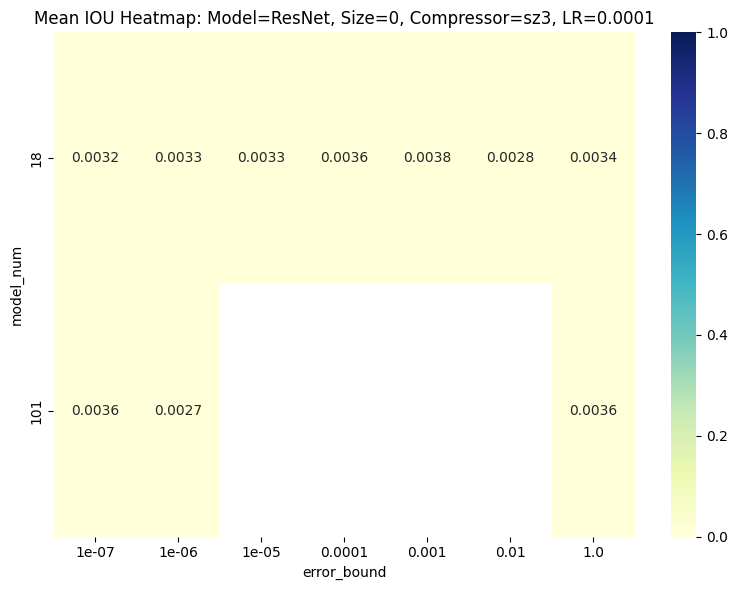

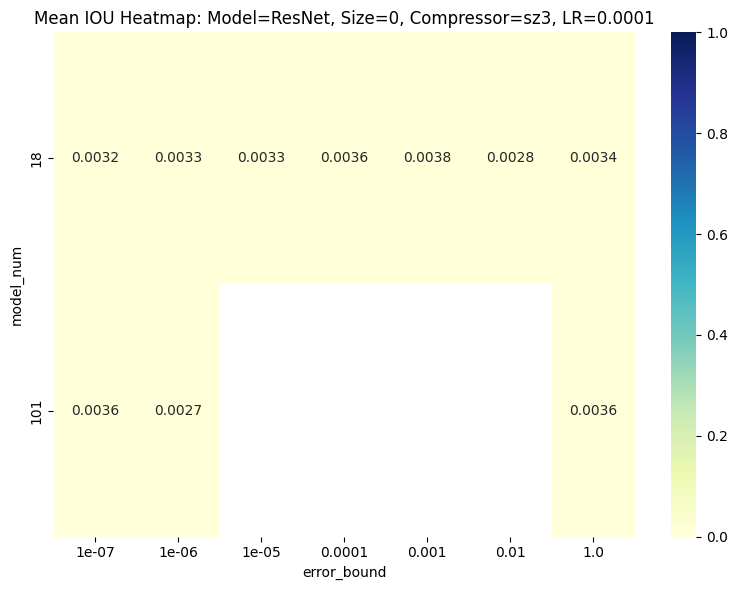

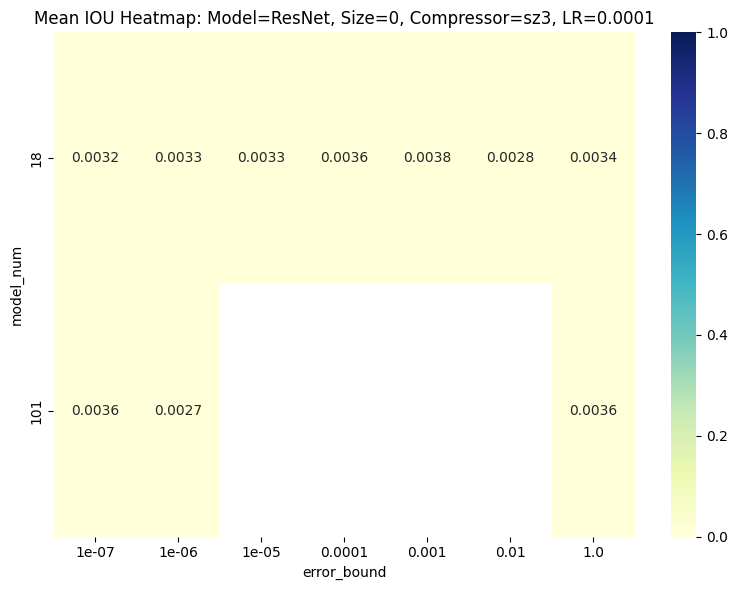

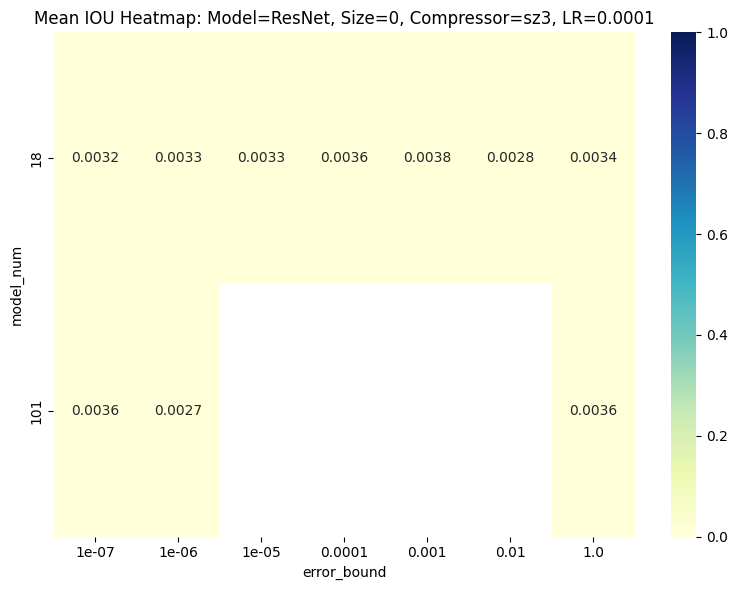

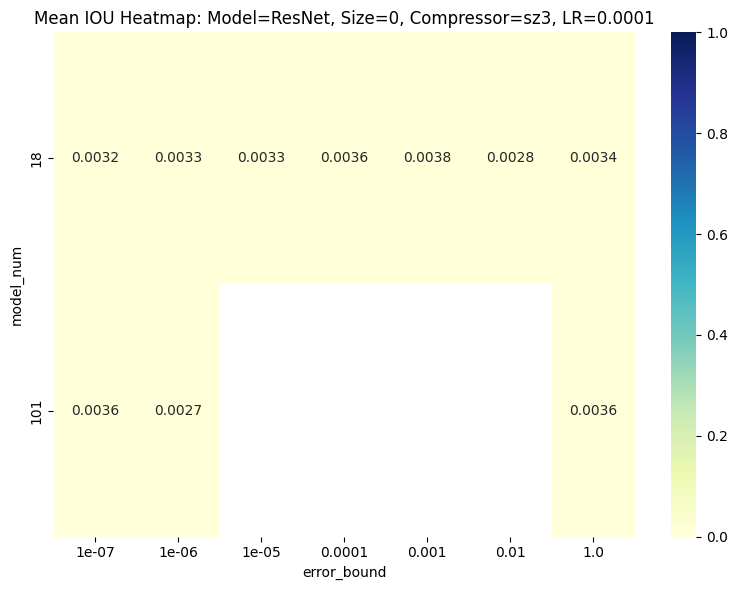

...

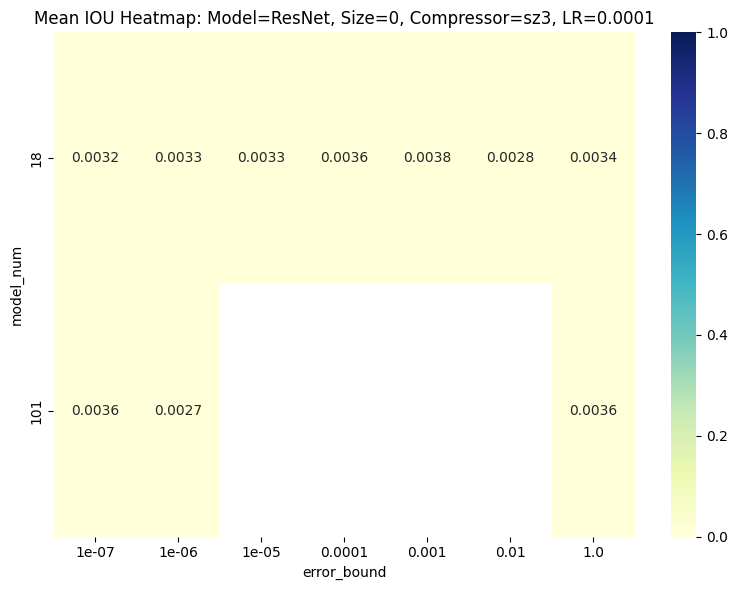

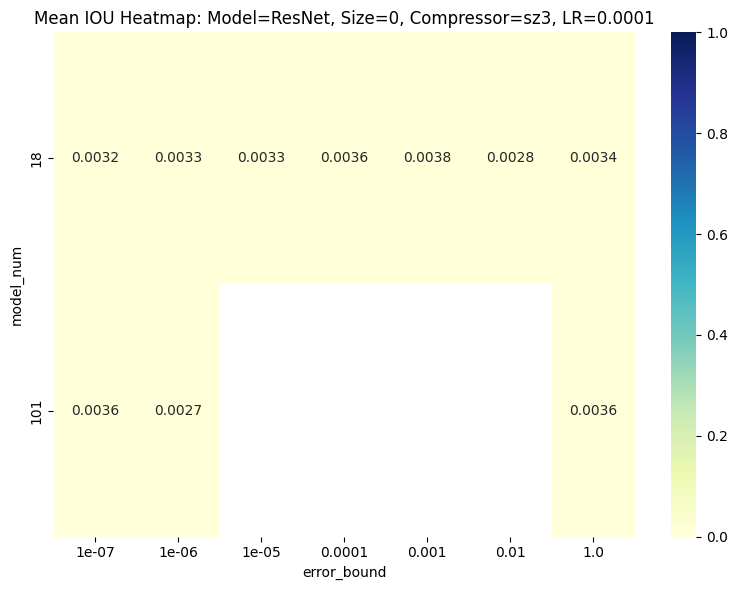

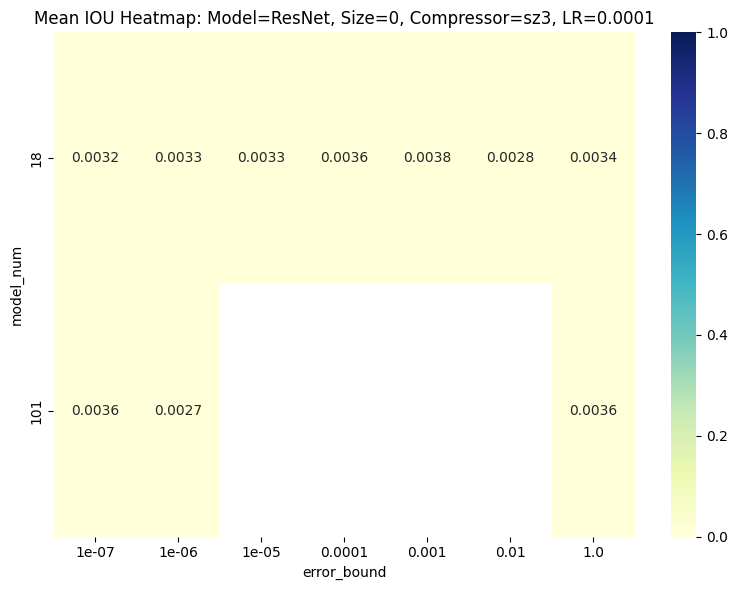

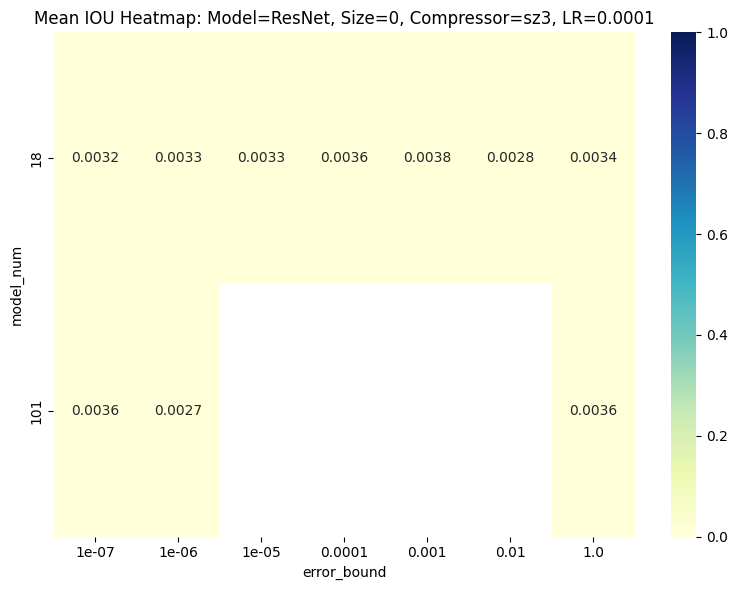

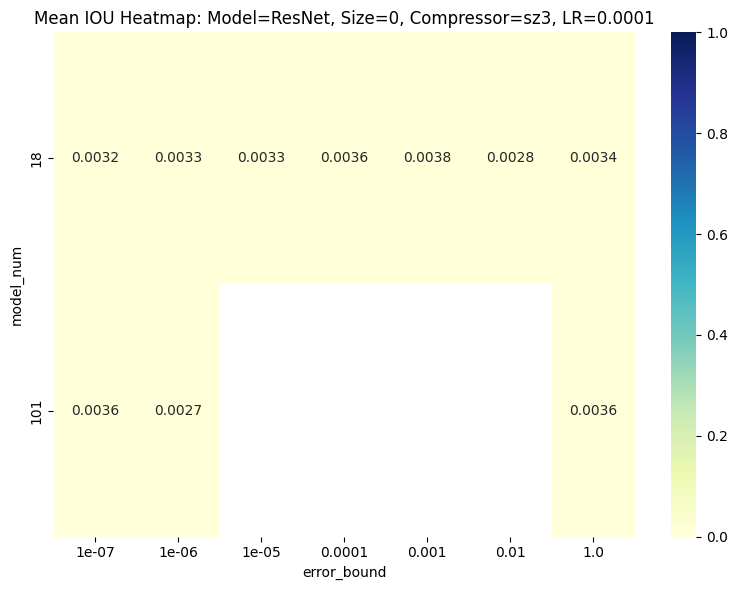

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load data
df = pd.read_csv("/scratch/mfaykus/seg_val/resnet_hope223_test.csv")

# Ensure 'iou' is numeric and filter out invalid entries
df = df[df['iou'] != '0.0']
df['iou'] = df['iou'].astype(float)
#df = df[df['iou'] >= 0.001]

# Define columns to loop over (excluding ones used in the heatmap)
loop_columns = ['Model', 'size', 'Compressor', 'LR']

# Get unique combinations
unique_combinations = df[loop_columns].drop_duplicates()
unique_combinations = df[loop_columns]

# Loop through each combination
for _, row in unique_combinations.iterrows():
    # Filter based on the current combination
    subset = df.copy()
    for col in loop_columns:
        subset = subset[subset[col] == row[col]]

    if subset.empty:
        continue

    # Group and aggregate using 'iou' instead of 'miou'
    results_aggregated = subset.groupby(['model_num', 'error_bound'], as_index=False)['iou'].mean()

    # Pivot for heatmap
    pivoted = results_aggregated.pivot(index='model_num', columns='error_bound', values='iou')
    
    if pivoted.empty:
        continue

    # Plot heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(pivoted, annot=True, cmap='YlGnBu', vmin=0, vmax=1)

    # Title with combination values
    title = f"Mean IOU Heatmap: Model={row['Model']}, Size={row['size']}, Compressor={row['Compressor']}, LR={row['LR']}"
    plt.title(title)
    plt.tight_layout()
    plt.show()
